In [3]:
# importing relevant modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from datetime import datetime
import plotly.express as px
import plotly.graph_objs as go

In [4]:
print("Hello World!")

Hello World!


In [5]:
punjab= pd.read_csv("C:\Desktop\Smart Irrigation System\Punjab, India\Punjab_open-meteo-31.39N75.93E285m.csv")

In [6]:
"""""
temperature_2m	Instant	°C (°F)	Air temperature at 2 meters above ground
relative_humidity_2m	Instant	%	Relative humidity at 2 meters above ground
rain	Preceding hour sum	mm (inch)	Only liquid precipitation of the preceding hour including local showers and rain from large scale systems.
wind_speed_10m
weather_code	Instant	WMO code	Weather condition as a numeric code. Follow WMO weather interpretation codes. See table below for details. Weather code is calculated from cloud cover analysis, precipitation and snowfall. As barely no information about atmospheric stability is available, estimation about thunderstorms is not possible.
soil_temperature_28_to_100cm nstant	°C (°F)	Average temperature of different soil levels below ground.
soil_moisture_28_to_100cm Instant	m³/m³	Average soil water content as volumetric mixing ratio at 0-7, 7-28, 28-100 and 100-255 cm depths.
"""

'""\ntemperature_2m\tInstant\t°C (°F)\tAir temperature at 2 meters above ground\nrelative_humidity_2m\tInstant\t%\tRelative humidity at 2 meters above ground\nrain\tPreceding hour sum\tmm (inch)\tOnly liquid precipitation of the preceding hour including local showers and rain from large scale systems.\nwind_speed_10m\nweather_code\tInstant\tWMO code\tWeather condition as a numeric code. Follow WMO weather interpretation codes. See table below for details. Weather code is calculated from cloud cover analysis, precipitation and snowfall. As barely no information about atmospheric stability is available, estimation about thunderstorms is not possible.\nsoil_temperature_28_to_100cm nstant\t°C (°F)\tAverage temperature of different soil levels below ground.\nsoil_moisture_28_to_100cm Instant\tm³/m³\tAverage soil water content as volumetric mixing ratio at 0-7, 7-28, 28-100 and 100-255 cm depths.\n'

In [7]:
""""Alluvial Soils
Punjab is dominated by an alluvial plain, formed by the alluvial deposits of the rivers like Sutlej, Beas, Ravi, Chenab, and Ghaggar.
The alluvial soils are the most widespread and fertile soils in Punjab.
These soils have a loamy to clayey texture in the eastern parts of Punjab, and a sandy to sandy loam texture in the central and southwestern regions.
"""

'"Alluvial Soils\nPunjab is dominated by an alluvial plain, formed by the alluvial deposits of the rivers like Sutlej, Beas, Ravi, Chenab, and Ghaggar.\nThe alluvial soils are the most widespread and fertile soils in Punjab.\nThese soils have a loamy to clayey texture in the eastern parts of Punjab, and a sandy to sandy loam texture in the central and southwestern regions.\n'

In [8]:
punjab.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 8 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   time                               35064 non-null  object 
 1   temperature_2m (°C)                35064 non-null  float64
 2   relative_humidity_2m (%)           35064 non-null  int64  
 3   rain (mm)                          35064 non-null  float64
 4   weather_code (wmo code)            35064 non-null  int64  
 5   wind_speed_10m (km/h)              35064 non-null  float64
 6   soil_temperature_28_to_100cm (°C)  35064 non-null  float64
 7   soil_moisture_28_to_100cm (m³/m³)  35064 non-null  float64
dtypes: float64(5), int64(2), object(1)
memory usage: 2.1+ MB


In [9]:
punjab.head(3)

,time,temperature_2m (°C),relative_humidity_2m (%),rain (mm),weather_code (wmo code),wind_speed_10m (km/h),soil_temperature_28_to_100cm (°C),soil_moisture_28_to_100cm (m³/m³)
0,2020-01-01T00:00,5.8,98,0.0,3,7.8,13.6,0.327
1,2020-01-01T01:00,5.4,99,0.0,2,3.3,13.6,0.327
2,2020-01-01T02:00,4.3,100,0.0,3,2.9,13.5,0.327


In [10]:
punjab.describe().T

,count,mean,std,min,25%,50%,75%,max
temperature_2m (°C),35064.0,22.644804,7.910950,2.600,16.200,24.200,28.600,43.400
relative_humidity_2m (%),35064.0,68.007158,20.573979,9.000,54.000,72.000,85.000,100.000
rain (mm),35064.0,0.098449,0.627933,0.000,0.000,0.000,0.000,26.200
weather_code (wmo code),35064.0,5.522701,15.871611,0.000,0.000,0.000,1.000,65.000
wind_speed_10m (km/h),35064.0,7.661356,3.917377,0.000,5.100,7.000,9.400,44.900
soil_temperature_28_to_100cm (°C),35064.0,23.213661,5.373268,13.200,18.600,24.300,28.300,31.100
soil_moisture_28_to_100cm (m³/m³),35064.0,0.267997,0.054218,0.143,0.227,0.274,0.308,0.383


## EDA

c:\Users\godwi\Downloads\Anconda\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


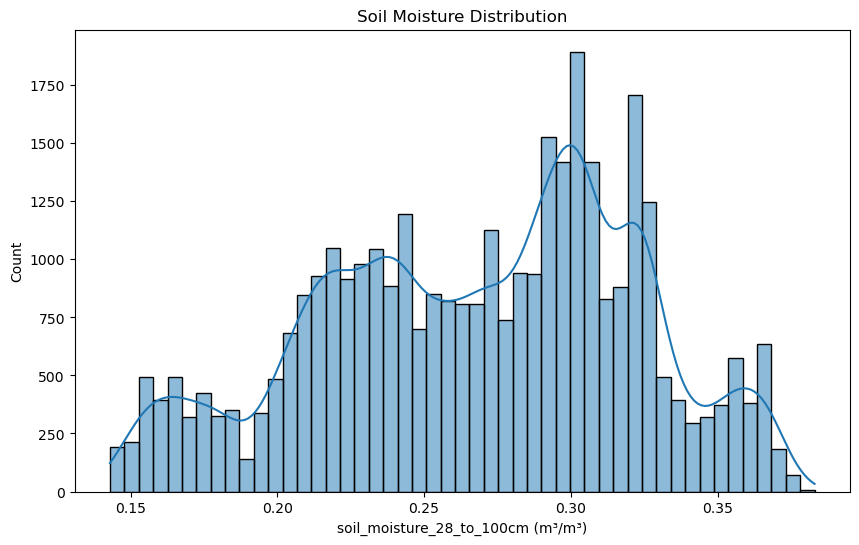

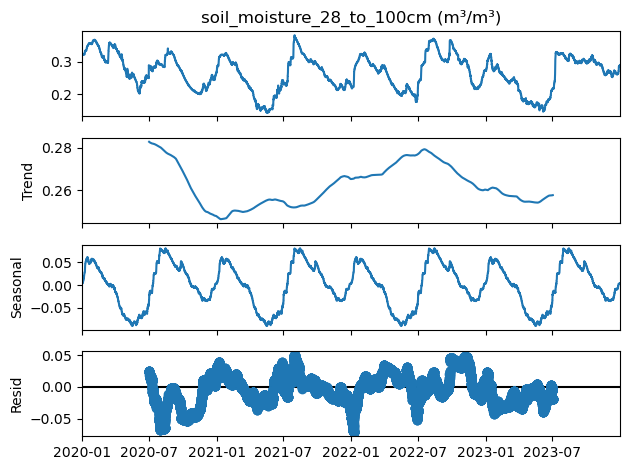

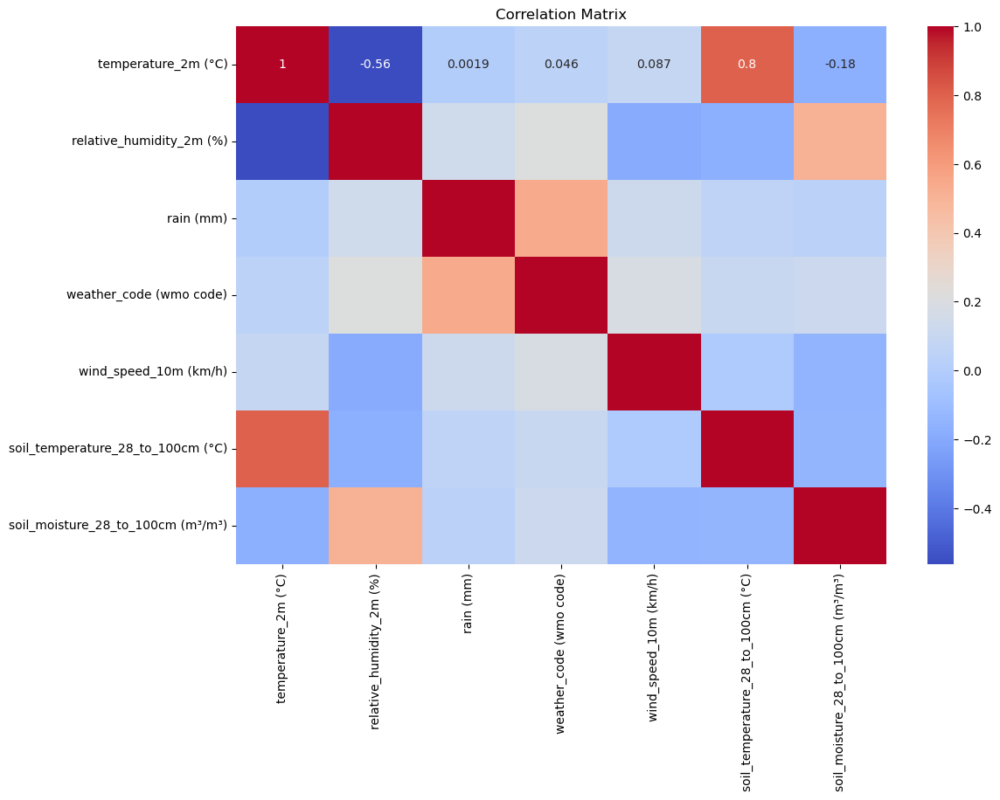

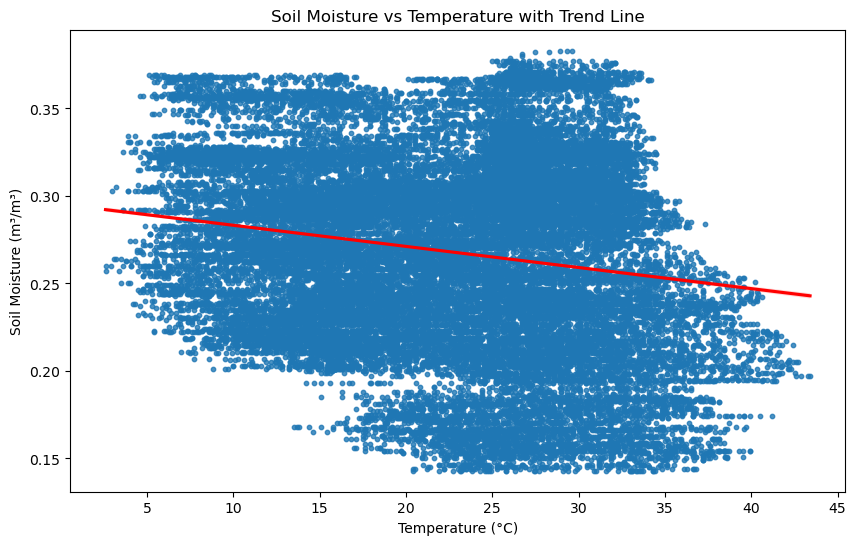

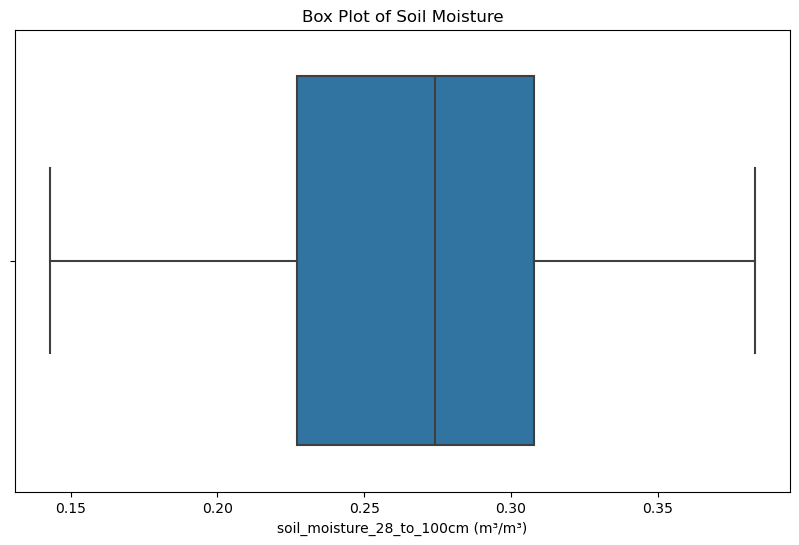

In [11]:

# Convert 'time' column to datetime
punjab['time'] = pd.to_datetime(punjab['time'])

# Set 'time' column as index
punjab.set_index('time', inplace=True)


# Distribution analysis
plt.figure(figsize=(10, 6))
sns.histplot(punjab['soil_moisture_28_to_100cm (m³/m³)'], kde=True)
plt.title('Soil Moisture Distribution')
plt.show()

# Time series analysis
#plt.figure(figsize=(12, 6))
#plt.plot(punjab.index, punjab['soil_moisture_28_to_100cm (m³/m³)'])
#plt.title('Soil Moisture Over Time')
#plt.xlabel('Time')
#plt.ylabel('Soil Moisture (m³/m³)')
#plt.show()

# Seasonal decomposition
decomposition = seasonal_decompose(punjab['soil_moisture_28_to_100cm (m³/m³)'], model='additive', period=24*365)
decomposition.plot()
plt.show()

# Correlation analysis
numeric_cols = punjab.select_dtypes(include=[np.number]).columns
corr_matrix = punjab[numeric_cols].corr()

plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# Scatter plot with trend line: Soil Moisture vs Temperature
plt.figure(figsize=(10, 6))
sns.regplot(x='temperature_2m (°C)', y='soil_moisture_28_to_100cm (m³/m³)', data=punjab, scatter_kws={'s': 10}, line_kws={'color': 'red'})
plt.title('Soil Moisture vs Temperature with Trend Line')
plt.xlabel('Temperature (°C)')
plt.ylabel('Soil Moisture (m³/m³)')
plt.show()

# Anomaly detection: Box plot for soil moisture
plt.figure(figsize=(10, 6))
sns.boxplot(x=punjab['soil_moisture_28_to_100cm (m³/m³)'])
plt.title('Box Plot of Soil Moisture')
plt.show()


In [12]:
#punjab.set_index('Time', inplace=True)

# Create a Plotly figure using plotly.express
fig = px.line(punjab, x=punjab.index, y='soil_moisture_28_to_100cm (m³/m³)', title='Soil Moisture Over Time')

# Update x-axis and y-axis titles
fig.update_xaxes(title_text='Time')
fig.update_yaxes(title_text='Soil Moisture (m³/m³)')

# Show the figure
fig.show()

c:\Users\godwi\Downloads\Anconda\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  v = v.dt.to_pydatetime()


In [13]:
#punjab.set_index('Time', inplace=True)

# Create a Plotly figure using plotly.express
fig = px.line(punjab, x=punjab.index, y='temperature_2m (°C)', title='Temperature Over Time')

# Update x-axis and y-axis titles
fig.update_xaxes(title_text='Time')
fig.update_yaxes(title_text='Temperature_2m (°C))')

# Show the figure
fig.show()

c:\Users\godwi\Downloads\Anconda\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [14]:
#punjab.set_index('Time', inplace=True)

# Create a Plotly figure using plotly.express
fig = px.line(punjab, x=punjab.index, y='rain (mm)', title='Rain Over Time')

# Update x-axis and y-axis titles
fig.update_xaxes(title_text='Time')
fig.update_yaxes(title_text='Rain (mm)')

# Show the figure
fig.show()

c:\Users\godwi\Downloads\Anconda\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [15]:
#punjab.set_index('Time', inplace=True)

# Create a Plotly figure using plotly.express
fig = px.line(punjab, x=punjab.index, y="soil_temperature_28_to_100cm (°C)", title="Soil Temperature Over Time")

# Update x-axis and y-axis titles
fig.update_xaxes(title_text='Time')
fig.update_yaxes(title_text='Soil_temperature_28_to_100cm (°C)')

# Show the figure
fig.show()

c:\Users\godwi\Downloads\Anconda\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [16]:
#punjab.set_index('Time', inplace=True)

# Create a Plotly figure using plotly.express
fig = px.line(punjab, x=punjab.index, y='wind_speed_10m (km/h)', title='(Wind speed Over Time')

# Update x-axis and y-axis titles
fig.update_xaxes(title_text='Time')
fig.update_yaxes(title_text='Wind_speed_10m (km/h)')

# Show the figure
fig.show()

c:\Users\godwi\Downloads\Anconda\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [17]:


#punjab.set_index('Time', inplace=True)

# Create a Plotly figure using plotly.express
fig = px.line(punjab, x=punjab.index, y='relative_humidity_2m (%)', title='(Relaive humidity Over Time')

# Update x-axis and y-axis titles
fig.update_xaxes(title_text='Time')
fig.update_yaxes(title_text='Relative_humidity_2m (%)')

# Show the figure
fig.show()

c:\Users\godwi\Downloads\Anconda\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [18]:
#punjab.set_index('time', inplace=True)

# Create a Plotly figure
fig = go.Figure()

# Add traces for each variable
fig.add_trace(go.Scatter(
    x=punjab.index, y=punjab['temperature_2m (°C)'],
    mode='lines', name='Temperature (°C)',
    yaxis='y1'
))

fig.add_trace(go.Scatter(
    x=punjab.index, y=punjab['relative_humidity_2m (%)'],
    mode='lines', name='Relative Humidity (%)',
    yaxis='y2'
))

fig.add_trace(go.Scatter(
    x=punjab.index, y=punjab['rain (mm)'],
    mode='lines', name='Rain (mm)',
    yaxis='y3'
))

fig.add_trace(go.Scatter(
    x=punjab.index, y=punjab['wind_speed_10m (km/h)'],
    mode='lines', name='Wind Speed (km/h)',
    yaxis='y4'
))

fig.add_trace(go.Scatter(
    x=punjab.index, y=punjab['soil_temperature_28_to_100cm (°C)'],
    mode='lines', name='Soil Temperature (°C)',
    yaxis='y5'
))

fig.add_trace(go.Scatter(
    x=punjab.index, y=punjab['soil_moisture_28_to_100cm (m³/m³)'],
    mode='lines', name='Soil Moisture (m³/m³)',
    yaxis='y6'
))

# Update layout for multiple y-axes
fig.update_layout(
    title={
        'text': 'Environmental Data Over Time',
        'x': 0.5,
        'xanchor': 'center'
    },
    height=700,  # Increase the height of the chart
    width=1500,  # Increase the width of the chart
    xaxis=dict(
        title='Time',
        rangeslider=dict(visible=True)  # Add a time slider
    ),
    yaxis=dict(
        title='Temperature (°C)',
        titlefont=dict(color='blue'),
        tickfont=dict(color='blue'),
        side='left'
    ),
    yaxis2=dict(
        title='Relative Humidity (%)',
        titlefont=dict(color='orange'),
        tickfont=dict(color='orange'),
        overlaying='y',
        side='left',
        position=0.15
    ),
    yaxis3=dict(
        title='Rain (mm)',
        titlefont=dict(color='green'),
        tickfont=dict(color='green'),
        overlaying='y',
        side='left',
        position=0.3
    ),
    yaxis4=dict(
        title='Wind Speed (km/h)',
        titlefont=dict(color='purple'),
        tickfont=dict(color='purple'),
        overlaying='y',
        side='right'
    ),
    yaxis5=dict(
        title='Soil Temperature (°C)',
        titlefont=dict(color='brown'),
        tickfont=dict(color='brown'),
        overlaying='y',
        side='right',
        position=0.85
    ),
    yaxis6=dict(
        title='Soil Moisture (m³/m³)',
        titlefont=dict(color='pink'),
        tickfont=dict(color='pink'),
        overlaying='y',
        side='right',
        position=0.7
    ),
    legend=dict(orientation='h', x=0.5, xanchor='center', yanchor='top')
)

# Show the figure
fig.show()